In [3]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import copy
import seaborn as sn

In [2]:
global df

In [2]:
df=pd.read_csv('basel.csv',delimiter=';')
df.rename(columns={"Temperature  [2 m above gnd]": "Temperature", "Relative Humidity  [2 m above gnd]": "RelativeHumidity",'Mean Sea Level Pressure  [MSL]': "MeanSeaLevelPressure",'Total Precipitation (high resolution)  [sfc]':"TotalPrecipationhigh",'Total Precipitation (low resolution)  [sfc]':'TotalPrecipationlow','Snowfall Amount (high resolution)  [sfc]':'SnowfallAmounthigh','Snowfall Amount (low resolution)  [sfc]':'SnowfallAmountlow','Total Cloud Cover  [sfc]':'TotalCloudCover','High Cloud Cover  [high cld lay]':'HighCloudCover','Medium Cloud Cover  [mid cld lay]':'MediumCloudCover','Low Cloud Cover  [low cld lay]':'LowCloudCover','Sunshine Duration  [sfc]':'SunshineDuration','Shortwave Radiation  [sfc]':'ShortwaveRadiation','Wind Speed  [10 m above gnd]':'WindSpeed10','Wind Direction  [10 m above gnd]':'WindDirection10','Wind Speed  [80 m above gnd]':'WindSpeed80','Wind Direction  [80 m above gnd]':'WindDirection80','Wind Speed  [900 mb]':'WindSpeed900','Wind Direction  [900 mb]':'WindDirection900','Wind Gust  [sfc]':'WindGust'},inplace=True)

In [301]:
datframe=df[['Month']]

In [302]:
datframe_d=df[['Day']]

In [303]:
df['date'] = pd.to_datetime(df[['Year', 'Month', 'Day', 'Hour', 'Minute']])

In [72]:
df.drop(['Year', 'Month', 'Day', 'Hour', 'Minute'],axis=1,inplace=True)
df.set_index('date',inplace=True)

In [73]:
df.drop([df.columns[3],df.columns[4],df.columns[5],df.columns[6],df.columns[8],df.columns[9]], axis=1,inplace=True)

In [9]:
df.dropna(inplace=True)
df.head()
#len(df)


,Temperature,RelativeHumidity,MeanSeaLevelPressure,TotalCloudCover,LowCloudCover,SunshineDuration,ShortwaveRadiation,WindSpeed10,WindDirection10,WindSpeed80,WindDirection80,WindSpeed900,WindDirection900,WindGust
date,,,,,,,,,,,,,,
1985-02-16 00:00:00,-4.30,84.0,1026.4,100.0,100.0,-999.0,0.0,13.79,69.36,10.58,70.96,52.29,87.61,26.64
1985-02-16 01:00:00,-4.51,84.0,1027.1,100.0,14.0,0.0,0.0,12.37,69.21,10.82,72.83,59.68,88.68,26.28
1985-02-16 02:00:00,-4.85,85.0,1027.6,100.0,9.0,0.0,0.0,11.04,67.87,10.35,74.99,64.85,89.73,26.28
1985-02-16 03:00:00,-6.34,88.0,1027.8,83.0,6.0,0.0,0.0,9.93,68.20,9.23,76.43,67.10,91.35,29.88
1985-02-16 04:00:00,-8.75,85.0,1028.5,32.0,3.0,0.0,0.0,9.62,67.46,7.51,75.27,67.18,93.18,29.52


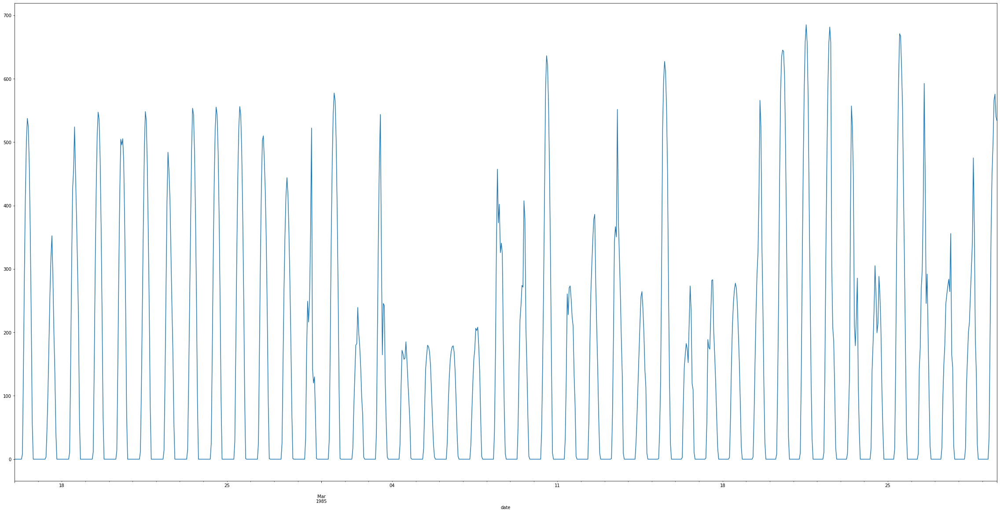

In [10]:
df['ShortwaveRadiation'][:1000].plot(figsize=(40,20))

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000001F75FB25748>,
      dtype=object)

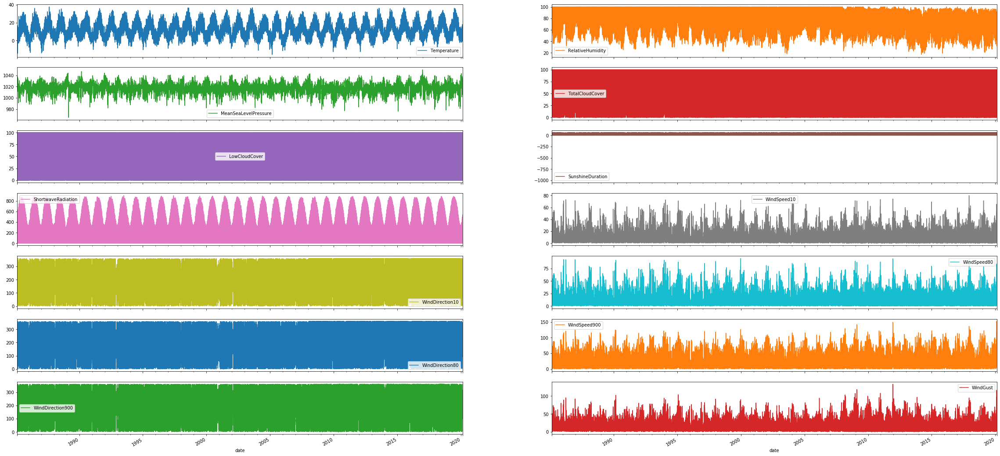

In [11]:
df.plot(subplots=True, layout=(7,2),figsize=(40,20))


In [12]:
df[300000:].corr()

,Temperature,RelativeHumidity,MeanSeaLevelPressure,TotalCloudCover,LowCloudCover,SunshineDuration,ShortwaveRadiation,WindSpeed10,WindDirection10,WindSpeed80,WindDirection80,WindSpeed900,WindDirection900,WindGust
Temperature,1.000000,-0.575941,-0.199687,-0.164046,-0.178827,0.402874,0.540570,-0.112282,0.051289,-0.187069,0.019987,-0.312785,-0.026274,-0.171237
RelativeHumidity,-0.575941,1.000000,-0.004420,0.291859,0.345000,-0.523868,-0.639697,-0.029782,0.060248,0.070902,0.068213,0.109607,0.041166,-0.004598
MeanSeaLevelPressure,-0.199687,-0.004420,1.000000,-0.268955,-0.181103,0.103697,0.009481,-0.292317,-0.093135,-0.287937,-0.092401,-0.199984,-0.210593,-0.288588
TotalCloudCover,-0.164046,0.291859,-0.268955,1.000000,0.792403,-0.471993,-0.248147,0.225076,0.201933,0.223534,0.183829,0.232512,0.207673,0.236484
LowCloudCover,-0.178827,0.345000,-0.181103,0.792403,1.000000,-0.386793,-0.232878,0.227316,0.232824,0.212076,0.211855,0.217737,0.192393,0.234301
SunshineDuration,0.402874,-0.523868,0.103697,-0.471993,-0.386793,1.000000,0.683741,-0.062538,-0.049261,-0.167532,-0.061683,-0.239836,-0.130791,-0.145415
ShortwaveRadiation,0.540570,-0.639697,0.009481,-0.248147,-0.232878,0.683741,1.000000,0.019280,0.063688,-0.152141,0.044676,-0.256684,-0.090387,-0.091115
WindSpeed10,-0.112282,-0.029782,-0.292317,0.225076,0.227316,-0.062538,0.019280,1.000000,0.230025,0.946713,0.189453,0.709153,0.235301,0.866197
WindDirection10,0.051289,0.060248,-0.093135,0.201933,0.232824,-0.049261,0.063688,0.230025,1.000000,0.193657,0.864760,0.151900,0.353003,0.224718
WindSpeed80,-0.187069,0.070902,-0.287937,0.223534,0.212076,-0.167532,-0.152141,0.946713,0.193657,1.000000,0.145673,0.720459,0.213995,0.860135


In [13]:
corrMatrix = df.corr()

In [14]:
corrMatrix

,Temperature,RelativeHumidity,MeanSeaLevelPressure,TotalCloudCover,LowCloudCover,SunshineDuration,ShortwaveRadiation,WindSpeed10,WindDirection10,WindSpeed80,WindDirection80,WindSpeed900,WindDirection900,WindGust
Temperature,1.000000,-0.531693,-0.171794,-0.219865,-0.275655,0.385807,0.517178,-0.140098,0.069585,-0.147790,0.072530,-0.220358,0.057757,-0.121887
RelativeHumidity,-0.531693,1.000000,0.031551,0.377480,0.438817,-0.557222,-0.680809,-0.058110,-0.005066,0.014952,-0.014290,0.162838,0.031716,-0.010894
MeanSeaLevelPressure,-0.171794,0.031551,1.000000,-0.214186,-0.149311,0.077564,-0.019778,-0.231130,-0.130569,-0.243358,-0.128918,-0.158959,-0.123294,-0.270813
TotalCloudCover,-0.219865,0.377480,-0.214186,1.000000,0.838646,-0.556393,-0.301316,0.177188,0.198385,0.174570,0.182184,0.223028,0.162062,0.213226
LowCloudCover,-0.275655,0.438817,-0.149311,0.838646,1.000000,-0.482410,-0.311309,0.195903,0.201760,0.184568,0.180143,0.234166,0.139667,0.223394
SunshineDuration,0.385807,-0.557222,0.077564,-0.556393,-0.482410,1.000000,0.661805,-0.029370,-0.071419,-0.104930,-0.064755,-0.193433,-0.095901,-0.091271
ShortwaveRadiation,0.517178,-0.680809,-0.019778,-0.301316,-0.311309,0.661805,1.000000,0.062482,0.015355,-0.081758,0.013597,-0.213017,-0.057551,-0.020390
WindSpeed10,-0.140098,-0.058110,-0.231130,0.177188,0.195903,-0.029370,0.062482,1.000000,0.240845,0.946877,0.222163,0.743101,0.157571,0.886441
WindDirection10,0.069585,-0.005066,-0.130569,0.198385,0.201760,-0.071419,0.015355,0.240845,1.000000,0.248994,0.876349,0.219577,0.592890,0.217667
WindSpeed80,-0.147790,0.014952,-0.243358,0.174570,0.184568,-0.104930,-0.081758,0.946877,0.248994,1.000000,0.230669,0.795499,0.181081,0.890227


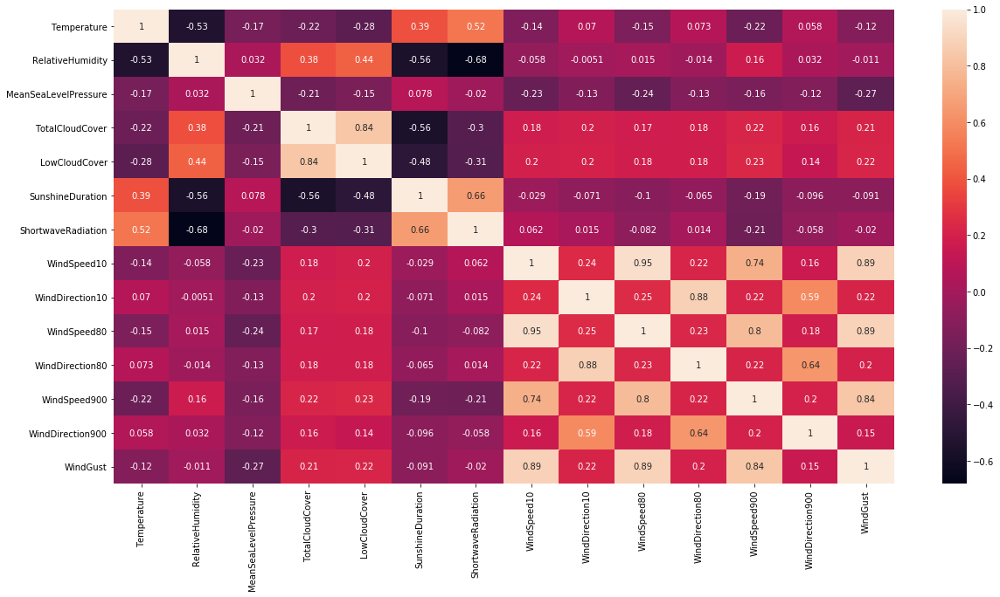

In [15]:
plt.figure(figsize = (20,10))
sn.heatmap(corrMatrix, annot=True)

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000001F70D358C48>,
      dtype=object)

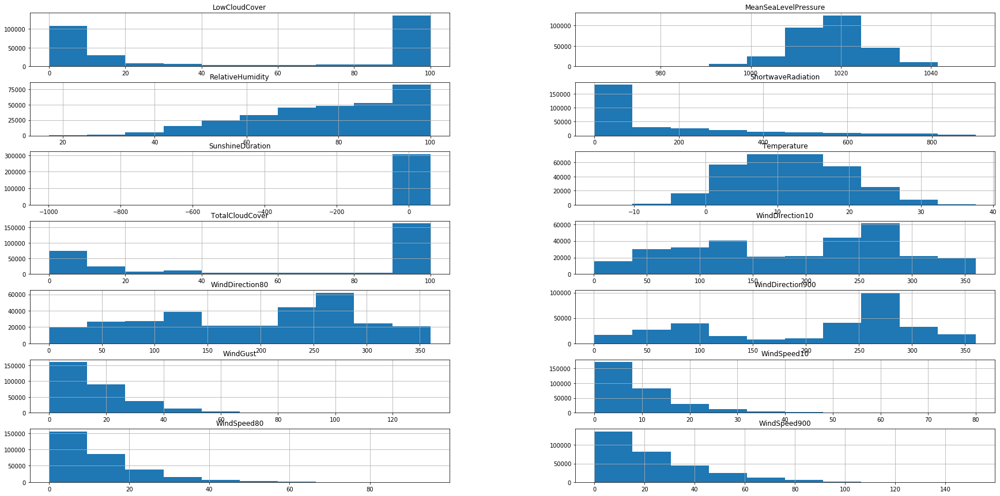

In [16]:

df.hist(grid=True,layout=(7,2),figsize=(30,15))

In [4]:
import numpy as np # import libraries
from numpy import fft
from scipy.fftpack import fft,fft2, fftshift
np.set_printoptions(suppress=True)

In [18]:
pd.options.display.float_format = '{:.2f}'.format # turn off scientific notation

In [19]:
data=df[:512]["Temperature"].values # validation data

In [20]:
#new_data=df[1024:1050]["Temperature"].values # test data

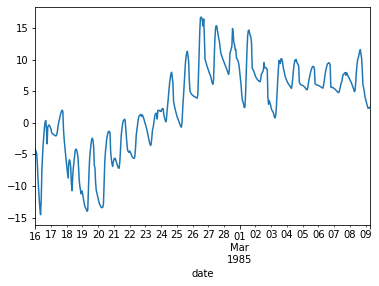

In [21]:
df[:512]["Temperature"].plot()

In [22]:

t=np.arange(1,len(data)+1) # set time

In [843]:
t

array([  1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,
        14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26,
        27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,  39,
        40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,  52,
        53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,  65,
        66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,  78,
        79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,  91,
        92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103, 104,
       105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117,
       118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130,
       131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143,
       144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156,
       157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169,
       170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 18

In [844]:
len(data)

512

In [845]:
trend=np.polyfit(t,data[:512],1)

In [846]:
trend # 1st number is the angle

array([ 0.03316948, -5.72961297])

In [847]:
new=[]

In [848]:
for i in range(len(t)): #subtract trend
    new.append(data[i]-trend[0]*t[i]-trend[1])
  

In [849]:
detdata=np.array(new) # data to array


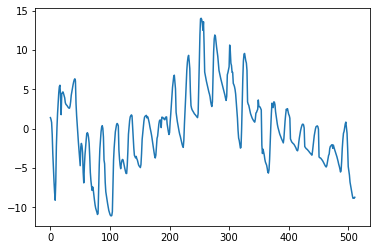

In [850]:
plt.plot(detdata)

In [851]:
fourier=fft(detdata) # fast fourier

In [852]:
fourier

array([  -0.          -0.j        , -958.62250063+362.7224142j ,
        622.97271727-203.73675188j,   16.67740973-127.18000288j,
        102.42935635-482.08655093j, -116.9887532 -214.74648191j,
       -176.54557135-122.84531469j, -274.38930367 -15.0634083j ,
        -49.97305722 -70.94426307j, -117.27373374 +76.62389292j,
       -167.65470716 +80.84689569j, -158.90140919 -84.81710598j,
         49.67494033+116.69364953j,  -63.45150404 -36.87154125j,
        -95.24983686-108.73548257j,  -37.70172034 +53.9173849j ,
        -20.32700524  -1.76147773j,  -85.30863605 +55.56816701j,
         82.91684358 +16.6387164j ,  -51.27479762-158.72317428j,
       -103.86862713 -25.55511682j, -638.2616839  -49.07492097j,
        422.16274406+126.71766101j,   60.34557916 +65.17257718j,
        164.07283894 -17.50520277j,   49.80156419-157.16337547j,
         40.68336811 +40.95795427j,   57.0323695  -75.41685498j,
         89.29933728 +16.8182752j ,   45.02551416 -39.81550048j,
        125.70111173 -61.

In [853]:
len(data)

512

In [854]:
n=detdata.size

In [855]:
len(detdata)

512

In [856]:
n

512

In [857]:
f = np.fft.fftfreq(n)

In [858]:
ampli=[]
phase=[]
for i in range(len(data)):  
    ampli.append(2/len(data)*np.absolute(fourier[i]))
    phase.append(np.angle(fourier[i]))

In [859]:
ampli=np.array(ampli)

In [860]:
amplitude=np.array(ampli[:512])

In [861]:
ampli=pd.DataFrame(ampli)

In [862]:
ampli=ampli[:512]

In [863]:
frequency=pd.DataFrame(f)

In [864]:
frequency=frequency[:512]

In [865]:
phase=pd.DataFrame(phase)

In [866]:
phase=phase[:512]

In [867]:
function=pd.concat([ampli, frequency,phase], axis=1)

In [868]:
function.iloc[1,:]

0   4.00
0   0.00
0   2.78
Name: 1, dtype: float64

In [869]:
time=np.arange(0,512)

In [870]:
time.reshape(512,1)

array([[  0],
       [  1],
       [  2],
       [  3],
       [  4],
       [  5],
       [  6],
       [  7],
       [  8],
       [  9],
       [ 10],
       [ 11],
       [ 12],
       [ 13],
       [ 14],
       [ 15],
       [ 16],
       [ 17],
       [ 18],
       [ 19],
       [ 20],
       [ 21],
       [ 22],
       [ 23],
       [ 24],
       [ 25],
       [ 26],
       [ 27],
       [ 28],
       [ 29],
       [ 30],
       [ 31],
       [ 32],
       [ 33],
       [ 34],
       [ 35],
       [ 36],
       [ 37],
       [ 38],
       [ 39],
       [ 40],
       [ 41],
       [ 42],
       [ 43],
       [ 44],
       [ 45],
       [ 46],
       [ 47],
       [ 48],
       [ 49],
       [ 50],
       [ 51],
       [ 52],
       [ 53],
       [ 54],
       [ 55],
       [ 56],
       [ 57],
       [ 58],
       [ 59],
       [ 60],
       [ 61],
       [ 62],
       [ 63],
       [ 64],
       [ 65],
       [ 66],
       [ 67],
       [ 68],
       [ 69],
       [ 70],
      

In [871]:
amplitude.reshape(-1,)


array([0.        , 4.00371503, 2.56031869, 0.50105006, 1.92518776,
       0.95525521, 0.84015538, 1.07344714, 0.33897597, 0.54721459,
       0.72706973, 0.70359792, 0.49541673, 0.2866667 , 0.56466511,
       0.25699753, 0.07969994, 0.39769739, 0.33035075, 0.65156146,
       0.4178365 , 2.50056855, 1.72176027, 0.34695447, 0.64454698,
       0.64400455, 0.2255057 , 0.3693502 , 0.35495812, 0.23478386,
       0.54588046, 0.20371518, 0.13031453, 0.32590851, 0.22210003,
       0.22186462, 0.29944542, 0.18585712, 0.34502018, 0.13528165,
       0.10821602, 0.33183416, 0.45938133, 1.05110101, 0.04867038,
       0.27409916, 0.10354893, 0.2719195 , 0.11239114, 0.25637323,
       0.22562918, 0.32252867, 0.131943  , 0.22255652, 0.20133219,
       0.07469672, 0.09997693, 0.12134043, 0.09708479, 0.01182697,
       0.2307613 , 0.02044547, 0.11210678, 0.08261111, 0.21803533,
       0.0370821 , 0.06536302, 0.04119143, 0.07921788, 0.11227346,
       0.06409426, 0.0976573 , 0.05470086, 0.09246101, 0.02315

In [872]:
amplitude.shape

(512,)

In [873]:
time.shape

(512,)

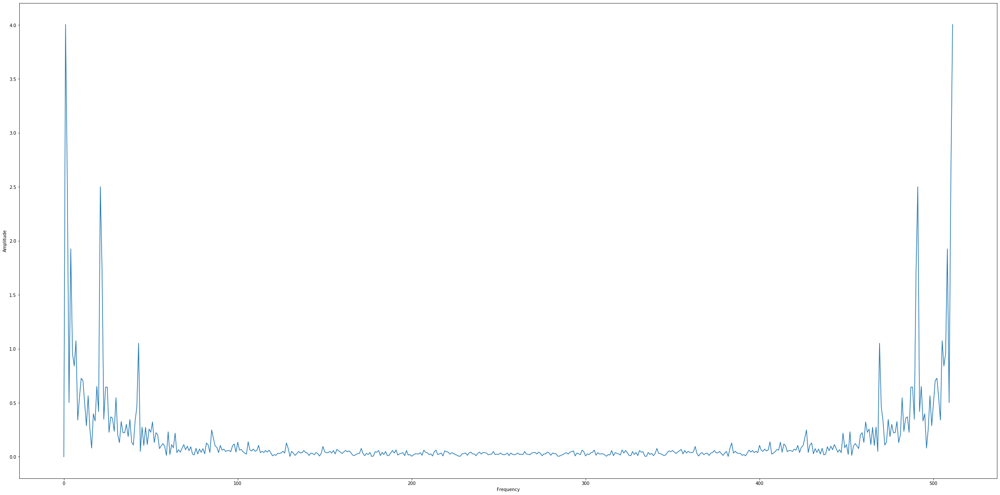

In [874]:
plt.figure(figsize = (40,20))
plt.ylabel("Amplitude")
plt.xlabel("Frequency")
plt.plot(time, amplitude)

In [875]:
function_n=function[:256]


In [876]:
function_n.columns=['amplitude','frequency','phase']
f_O=function_n.iloc[0,0]

In [877]:
f_O

9.76302372279747e-15

In [878]:
function_n

,amplitude,frequency,phase
0,0.00,0.00,-3.14
1,4.00,0.00,2.78
2,2.56,0.00,-0.32
3,0.50,0.01,-1.44
4,1.93,0.01,-1.36
...,...,...,...
251,0.03,0.49,0.89
252,0.02,0.49,-0.19
253,0.02,0.49,-0.22
254,0.02,0.50,-1.32


In [879]:
function_n=function_n[1:].sort_values('amplitude',ascending=False)


In [880]:
function_n

,amplitude,frequency,phase
1,4.00,0.00,2.78
2,2.56,0.00,-0.32
21,2.50,0.04,-3.06
4,1.93,0.01,-1.36
22,1.72,0.04,0.29
...,...,...,...
227,0.01,0.44,-0.32
228,0.00,0.45,-2.35
200,0.00,0.39,-2.71
177,0.00,0.35,1.36


In [881]:
function_n.reset_index(drop=True, inplace=True)

In [882]:
function_n.iloc[43,:]

amplitude   0.22
frequency   0.07
phase       0.92
Name: 43, dtype: float64

In [883]:
maxfreq = np.argmax(amplitude)
print('dominant freq ', maxfreq)

dominant freq  1


In [926]:
forecast=0
time_int=np.arange(0,512)
series=[]

In [927]:
for j in range(0,512):
    for i in range(1,20):
        forecast+=function.iloc[i,0]*np.cos(function_n.iloc[i,1]*np.pi*2*j+function_n.iloc[i,2])
    forecast=forecast+f_O
    series.append(forecast)
    forecast=0
   

In [928]:
series=series+trend[0]*time_int+trend[1]

In [929]:
error=series-data

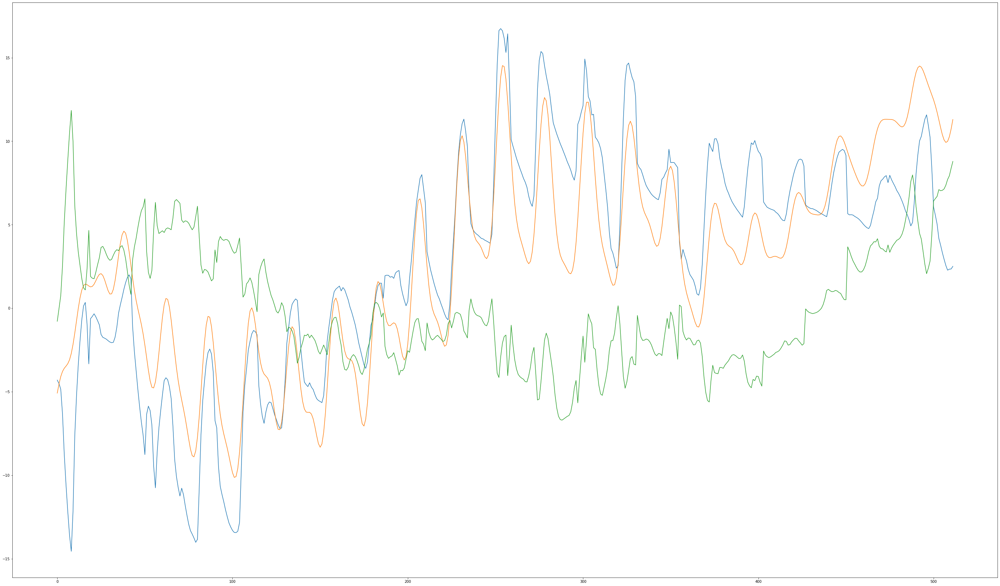

In [931]:
plt.figure(figsize = (50,30))
plt.plot(data)
plt.plot(series)
plt.plot(error)

In [924]:
from sklearn.metrics import mean_squared_error
from math import sqrt

rms = sqrt(mean_squared_error(data,series))

In [925]:
rms

3.828194242777211

In [417]:
function.iloc[1,0]

2.4959939319586515

In [418]:
function

,0,0,0
0,22.06,0.00,-0.00
1,2.50,0.00,0.01
2,8.34,0.00,2.96
3,0.27,0.00,2.61
4,0.40,0.00,-2.59
...,...,...,...
16187,0.96,-0.00,2.72
16188,0.40,-0.00,2.59
16189,0.27,-0.00,-2.61
16190,8.34,-0.00,-2.96


In [7]:
def fourier(window,step): #window N^2
    global new_dat
    global error
    pd.options.display.float_format = '{:.2f}'.format # turn off scientific notation
    data=df[:window]["Temperature"].values # validation data
    t=np.arange(1,len(data)+1) # set time
    trend=np.polyfit(t,data[:window],1)
    new=[]
    for i in range(len(t)): #subtract trend
         new.append(data[i]-trend[0]*t[i]-trend[1])
    detdata=np.array(new) # data to array
    fourier=fft(detdata) # fast fourier
    n=detdata.size
    f = np.fft.fftfreq(n)
    ampli=[]
    phase=[]
    for i in range(len(data)):    #ampli and phase
        ampli.append(2/len(data)*np.absolute(fourier[i]))
        phase.append(np.angle(fourier[i]))
    ampli=np.array(ampli)
    amplitude=np.array(ampli[:window])
    ampli=pd.DataFrame(ampli)
    ampli=ampli[:window]
    frequency=pd.DataFrame(f)
    frequency=frequency[:window]
    phase=pd.DataFrame(phase)
    phase=phase[:window]
    function=pd.concat([ampli, frequency,phase], axis=1) #make one dataframe
    time=np.arange(0,window)
    time.reshape(window,1)
    amplitude.reshape(-1,)
    function_n=function[:128]
    function_n.columns=['amplitude','frequency','phase']
    f_O=function_n.iloc[0,0]
    function_n=function_n[1:].sort_values('amplitude',ascending=False)
    function_n.reset_index(drop=True, inplace=True)
    maxfreq = np.argmax(amplitude)
    print('dominant freq ', maxfreq)
    forecast=0
    time_int=np.arange(0,window)
    series=[]
    for j in range(0,window):
        for i in range(1,step):
             forecast+=function.iloc[i,0]*np.cos(function_n.iloc[i,1]*np.pi*2*j+function_n.iloc[i,2])
        forecast=forecast+f_O
        series.append(forecast)
        forecast=0
    series=series+trend[0]*time_int+trend[1]
    error=series-data
    plt.figure(figsize = (50,30))
    plt.plot(data)
    plt.plot(series)
    plt.plot(error)
    new_dat=data-error
    return()

dominant freq  85


()

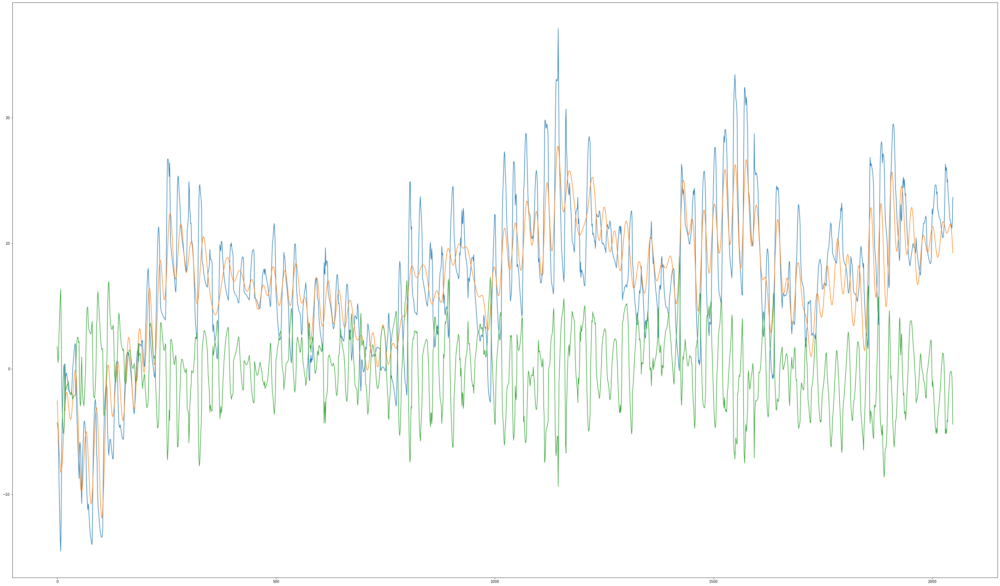

In [8]:
fourier(2048,60)

In [1222]:
def fourier_n(window,step): #window N^2
    global c
    pd.options.display.float_format = '{:.2f}'.format # turn off scientific notation
    data=error # validation data
    t=np.arange(1,len(data)+1) # set time
    trend=np.polyfit(t,data[:window],1)
    new=[]
    for i in range(len(t)): #subtract trend
         new.append(data[i]-trend[0]*t[i]-trend[1])
    detdata=np.array(new) # data to array
    fourier=fft(detdata) # fast fourier
    n=detdata.size
    f = np.fft.fftfreq(n)
    ampli=[]
    phase=[]
    for i in range(len(data)):    #ampli and phase
        ampli.append(2/len(data)*np.absolute(fourier[i]))
        phase.append(np.angle(fourier[i]))
    ampli=np.array(ampli)
    amplitude=np.array(ampli[:window])
    ampli=pd.DataFrame(ampli)
    ampli=ampli[:window]
    frequency=pd.DataFrame(f)
    frequency=frequency[:window]
    phase=pd.DataFrame(phase)
    phase=phase[:window]
    function=pd.concat([ampli, frequency,phase], axis=1) #make one dataframe
    time=np.arange(0,window)
    time.reshape(window,1)
    amplitude.reshape(-1,)
    function_n=function[:128]
    function_n.columns=['amplitude','frequency','phase']
    f_O=function_n.iloc[0,0]
    function_n=function_n[1:].sort_values('amplitude',ascending=False)
    function_n.reset_index(drop=True, inplace=True)
    maxfreq = np.argmax(amplitude)
    print('dominant freq ', maxfreq)
    forecast=0
    time_int=np.arange(0,window)
    series=[]
    for j in range(0,window):
        for i in range(1,step):
             forecast+=function.iloc[i,0]*np.cos(function_n.iloc[i,1]*np.pi*2*j+function_n.iloc[i,2])
        forecast=forecast+f_O
        series.append(forecast)
        forecast=0
    series=series+trend[0]*time_int+trend[1]
    c=series-data
    plt.figure(figsize = (50,30))
    plt.plot(data)
    plt.plot(series)
    res=data-c
    #plt.plot(c)
    return()

dominant freq  85


()

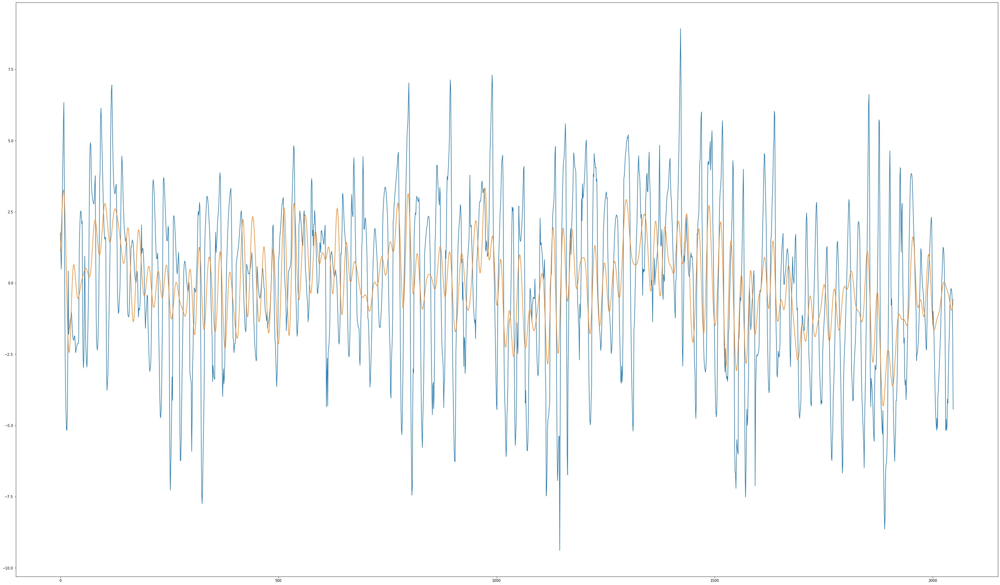

In [1223]:
fourier_n(2048,60)

In [1224]:
#last forecast

In [1225]:
def fourier_new(window,step): #window N^2
    global error
    pd.options.display.float_format = '{:.2f}'.format # turn off scientific notation
    data=df[:window]["Temperature"].values # validation data
    t=np.arange(1,len(data)+1) # set time
    trend=np.polyfit(t,data[:window],1)
    new=[]
    for i in range(len(t)): #subtract trend
         new.append(data[i]-trend[0]*t[i]-trend[1])
    detdata=np.array(new) # data to array
    fourier=fft(detdata) # fast fourier
    n=detdata.size
    f = np.fft.fftfreq(n)
    ampli=[]
    phase=[]
    for i in range(len(data)):    #ampli and phase
        ampli.append(2/len(data)*np.absolute(fourier[i]))
        phase.append(np.angle(fourier[i]))
    ampli=np.array(ampli)
    amplitude=np.array(ampli[:window])
    ampli=pd.DataFrame(ampli)
    ampli=ampli[:window]
    frequency=pd.DataFrame(f)
    frequency=frequency[:window]
    phase=pd.DataFrame(phase)
    phase=phase[:window]
    function=pd.concat([ampli, frequency,phase], axis=1) #make one dataframe
    time=np.arange(0,window)
    time.reshape(window,1)
    amplitude.reshape(-1,)
    function_n=function[:128]
    function_n.columns=['amplitude','frequency','phase']
    f_O=function_n.iloc[0,0]
    function_n=function_n[1:].sort_values('amplitude',ascending=False)
    function_n.reset_index(drop=True, inplace=True)
    maxfreq = np.argmax(amplitude)
    print('dominant freq ', maxfreq)
    forecast=0
    time_int=np.arange(0,window)
    series=[]
    for j in range(0,window):
        for i in range(1,step):
             forecast+=function.iloc[i,0]*np.cos(function_n.iloc[i,1]*np.pi*2*j+function_n.iloc[i,2])
        forecast=forecast+f_O
        series.append(forecast)
        forecast=0
    series=series+trend[0]*time_int+trend[1]+c
    error=series-data
    plt.figure(figsize = (50,30))
    plt.plot(data)
    plt.plot(series)
    plt.plot(error)
    new_dat=data-error
    return()

dominant freq  85


()

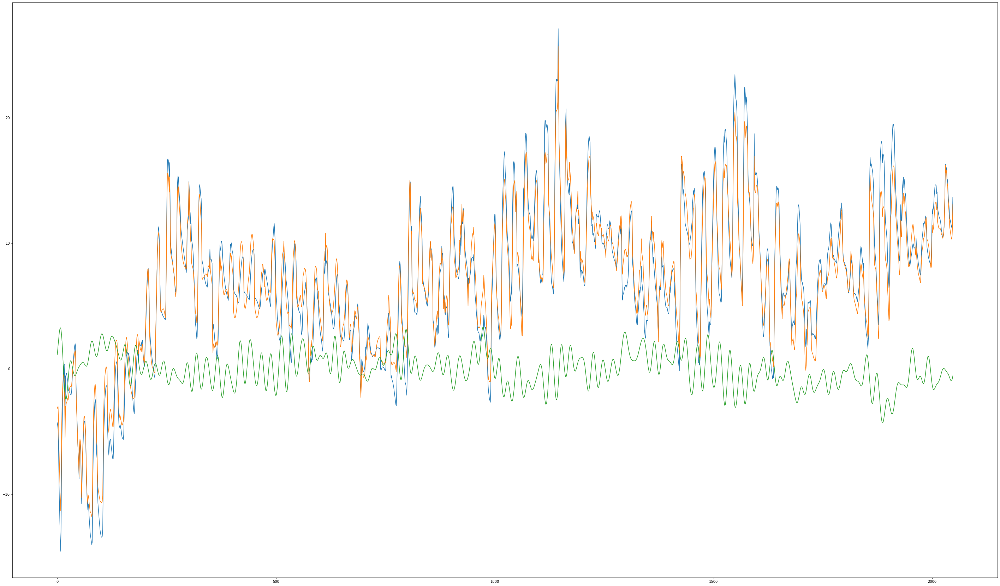

In [1226]:
fourier_new(2048,60)

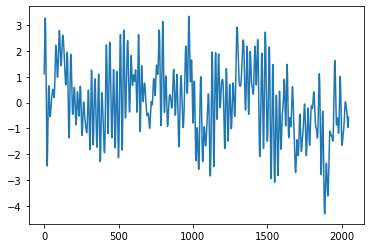

In [1227]:
plt.plot(error)


In [5]:
def fourier_ne(window,step): #window N^2
    global b
    pd.options.display.float_format = '{:.2f}'.format # turn off scientific notation
    data=error # validation data
    t=np.arange(1,len(data)+1) # set time
    trend=np.polyfit(t,data[:window],1)
    new=[]
    for i in range(len(t)): #subtract trend
         new.append(data[i]-trend[0]*t[i]-trend[1])
    detdata=np.array(new) # data to array
    fourier=fft(detdata) # fast fourier
    n=detdata.size
    f = np.fft.fftfreq(n)
    ampli=[]
    phase=[]
    for i in range(len(data)):    #ampli and phase
        ampli.append(2/len(data)*np.absolute(fourier[i]))
        phase.append(np.angle(fourier[i]))
    ampli=np.array(ampli)
    amplitude=np.array(ampli[:window])
    ampli=pd.DataFrame(ampli)
    ampli=ampli[:window]
    frequency=pd.DataFrame(f)
    frequency=frequency[:window]
    phase=pd.DataFrame(phase)
    phase=phase[:window]
    function=pd.concat([ampli, frequency,phase], axis=1) #make one dataframe
    time=np.arange(0,window)
    time.reshape(window,1)
    amplitude.reshape(-1,)
    function_n=function[:256]
    function_n.columns=['amplitude','frequency','phase']
    f_O=function_n.iloc[0,0]
    function_n=function_n[1:].sort_values('amplitude',ascending=False)
    function_n.reset_index(drop=True, inplace=True)
    maxfreq = np.argmax(amplitude)
    print('dominant freq ', maxfreq)
    forecast=0
    time_int=np.arange(0,window)
    series=[]
    for j in range(0,window):
        for i in range(1,step):
             forecast+=function.iloc[i,0]*np.cos(function_n.iloc[i,1]*np.pi*2*j+function_n.iloc[i,2])
        forecast=forecast+f_O
        series.append(forecast)
        forecast=0
    series=series+trend[0]*time_int+trend[1]
    b=series-data
    plt.figure(figsize = (50,30))
    plt.plot(data)
    plt.plot(series)
    res=data-b
    #plt.plot(c)
    return()

In [6]:
fourier_ne(2048,5)

NameError: name 'error' is not defined

In [1236]:
def fourier_l(window,step): #window N^2
    global series
    global data
    pd.options.display.float_format = '{:.2f}'.format # turn off scientific notation
    data=df[:window]["Temperature"].values # validation data
    t=np.arange(1,len(data)+1) # set time
    trend=np.polyfit(t,data[:window],1)
    new=[]
    for i in range(len(t)): #subtract trend
         new.append(data[i]-trend[0]*t[i]-trend[1])
    detdata=np.array(new) # data to array
    fourier=fft(detdata) # fast fourier
    n=detdata.size
    f = np.fft.fftfreq(n)
    ampli=[]
    phase=[]
    for i in range(len(data)):    #ampli and phase
        ampli.append(2/len(data)*np.absolute(fourier[i]))
        phase.append(np.angle(fourier[i]))
    ampli=np.array(ampli)
    amplitude=np.array(ampli[:window])
    ampli=pd.DataFrame(ampli)
    ampli=ampli[:window]
    frequency=pd.DataFrame(f)
    frequency=frequency[:window]
    phase=pd.DataFrame(phase)
    phase=phase[:window]
    function=pd.concat([ampli, frequency,phase], axis=1) #make one dataframe
    time=np.arange(0,window)
    time.reshape(window,1)
    amplitude.reshape(-1,)
    function_n=function[:256]
    function_n.columns=['amplitude','frequency','phase']
    f_O=function_n.iloc[0,0]
    function_n=function_n[1:].sort_values('amplitude',ascending=False)
    function_n.reset_index(drop=True, inplace=True)
    maxfreq = np.argmax(amplitude)
    print('dominant freq ', maxfreq)
    forecast=0
    time_int=np.arange(0,window)
    series=[]
    for j in range(0,window):
        for i in range(1,step):
             forecast+=function.iloc[i,0]*np.cos(function_n.iloc[i,1]*np.pi*2*j+function_n.iloc[i,2])
        forecast=forecast+f_O
        series.append(forecast)
        forecast=0
    series=series+trend[0]*time_int+trend[1]+c+b
    error=series-data
    plt.figure(figsize = (50,30))
    plt.plot(data)
    plt.plot(series)
    plt.plot(error)
    new_dat=data-error
    #forecast
    forecast=0
    time_int=np.arange(2048,2090)
    series=[]
    for j in range(2048,2090):
        for i in range(1,60):
                forecast+=function.iloc[i,0]*np.cos(function_n.iloc[i,1]*np.pi*2*j+function_n.iloc[i,2])
        forecast=forecast+f_O
        series.append(forecast)
        forecast=0
    series=series+trend[0]*time_int+trend[1]
    plt.figure(figsize = (50,30))
    plt.plot(df[2048:2090]["Temperature"].values)
    plt.plot(series)
   # plt.plot(error)
    
    
    return()

dominant freq  85


()

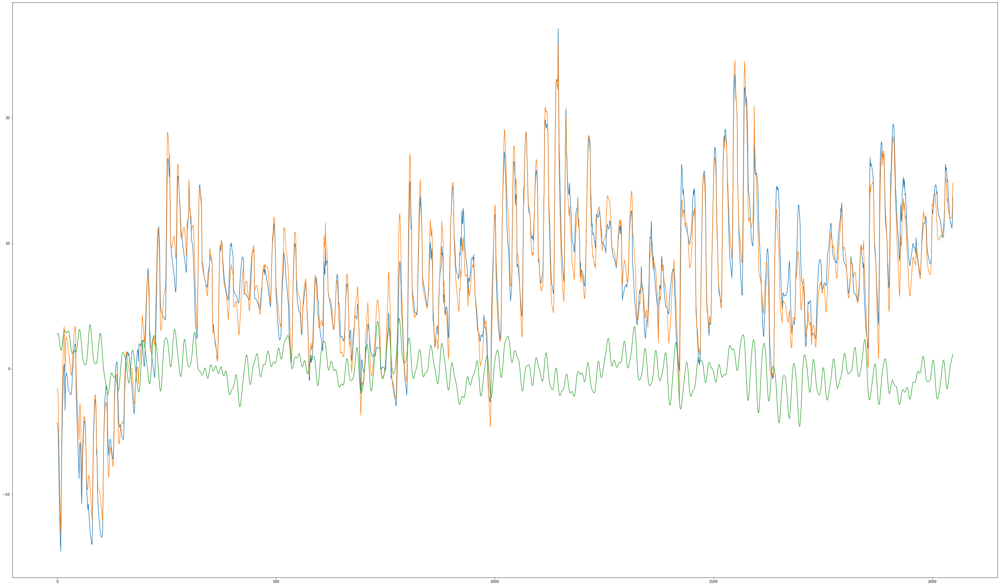

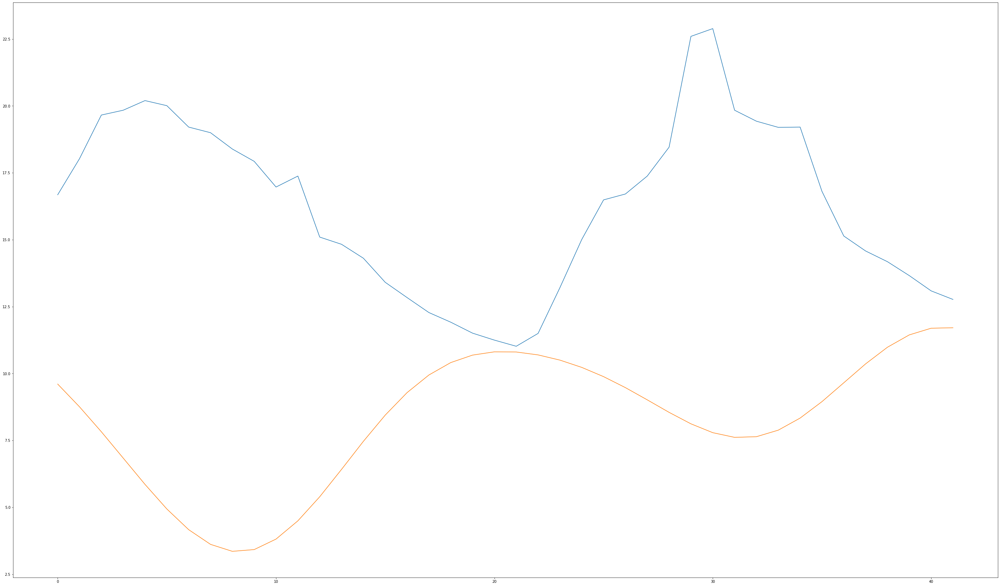

In [1237]:
fourier_l(2048,60)

In [1238]:
from sklearn.metrics import mean_squared_error
from math import sqrt

rms = sqrt(mean_squared_error(data,series))

ValueError: Found input variables with inconsistent numbers of samples: [2048, 42]

In [1239]:
print(rms)

1.421181213034766


RANDOM FOREST

In [74]:
datframe_d=datframe_d[:20000].values

In [75]:
train_d=[]

In [76]:
for i in range(0,len(datframe_d)-100):
    train_d.append(datframe_d[i:i+100])
train_d=np.array(train_d)

In [77]:
train_d.shape

(19900, 100, 1)

In [78]:
train_d=train_d.reshape(19900,100)

In [79]:
datframe=datframe[:20000].values

In [80]:
train_m=[]

In [81]:
train_m

[]

In [82]:

for i in range(0,len(datframe)-100):
    train_m.append(datframe[i:i+100])
train_m=np.array(train_m)

In [83]:
train_m.shape

(19900, 100, 1)

In [84]:
train_m=train_m.reshape(19900,100)

In [85]:
train_m

array([[2, 2, 2, ..., 2, 2, 2],
       [2, 2, 2, ..., 2, 2, 2],
       [2, 2, 2, ..., 2, 2, 2],
       ...,
       [5, 5, 5, ..., 5, 5, 5],
       [5, 5, 5, ..., 5, 5, 5],
       [5, 5, 5, ..., 5, 5, 5]], dtype=int64)

In [42]:
data=df[:7000]["Temperature"].values

In [43]:
train=[]
for i in range(0,len(data)-100):
    train.append(data[i:i+100])
train=np.array(train)

In [44]:
train.shape

(6900, 100)

In [86]:
train=np.concatenate((train_m,train_d),axis=1)

In [90]:
train

array([[ 2,  2,  2, ..., 20, 20, 20],
       [ 2,  2,  2, ..., 20, 20, 20],
       [ 2,  2,  2, ..., 20, 20, 20],
       ...,
       [ 5,  5,  5, ..., 30, 30, 30],
       [ 5,  5,  5, ..., 30, 30, 30],
       [ 5,  5,  5, ..., 30, 30, 30]], dtype=int64)

In [91]:
test=df[100:20000]["Temperature"].values

In [157]:
from sklearn.model_selection import train_test_split

In [233]:
X_train, X_test,y_train, y_test=train_test_split(train,y, test_size=0.1, random_state=0)

In [234]:
X_train.shape

(1965, 209)

In [235]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test=sc.transform(X_test)

In [236]:
from sklearn.ensemble import RandomForestRegressor

regressor=RandomForestRegressor(n_estimators=300, random_state=0)
regressor.fit(X_train, y_train)
y_pred=regressor.predict(X_test)

In [237]:
from sklearn import metrics
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test,y_pred))
print('Mean Squared Error', metrics.mean_squared_error(y_test, y_pred))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
print('Accuracy_score:', metrics.r2_score(y_test,y_pred))

Mean Absolute Error: 0.7986394216133943
Mean Squared Error 1.1906966878488063
Root Mean Squared Error: 1.0911904910916363
Accuracy_score: 0.9624307336519032


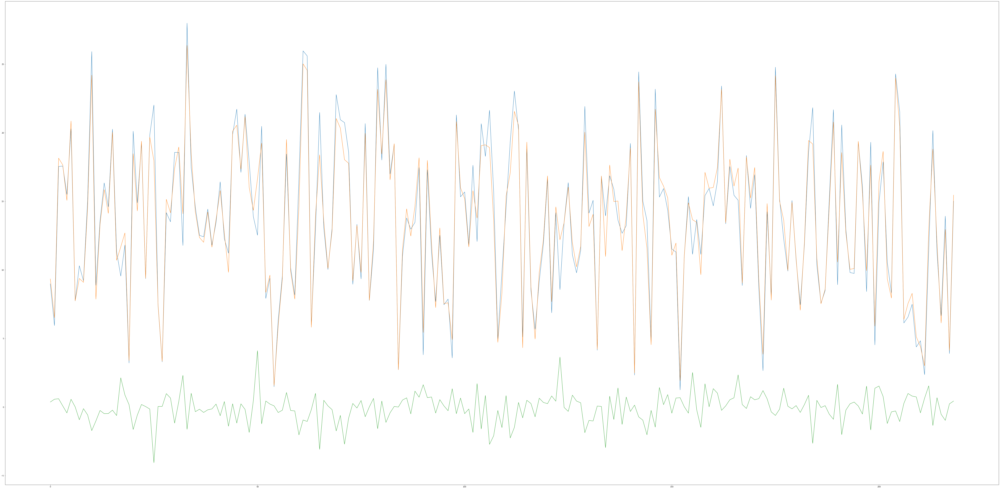

In [238]:
plt.figure(figsize = (100,50))
plt.plot(y_test)
plt.plot(y_pred)
plt.plot(y_pred-y_test)

In [239]:
import sklearn

In [240]:
from sklearn.svm import SVR

In [241]:
for k in ['linear','poly','rbf','sigmoid']:
    clf=sklearn.svm.SVR(kernel=k)
    clf.fit(X_train, y_train)
    confidence=clf.score(X_train, y_train)
    print(k,confidence)

linear 0.782443425031372
poly 0.8222163241880749
rbf 0.8840265661311562
sigmoid -37.72926628323201


In [242]:
Svr=sklearn.svm.SVR(kernel='rbf')
Svr.fit(X_train, y_train)
y_pred=Svr.predict(X_test)
print(Svr.score(X_train,y_train))


0.8840265661311562


In [243]:
error=np.sqrt(metrics.mean_squared_error(y_test,Svr.predict(X_test)))
print('RMSE value of the SVR Model is:', error)

RMSE value of the SVR Model is: 2.2172154170721683


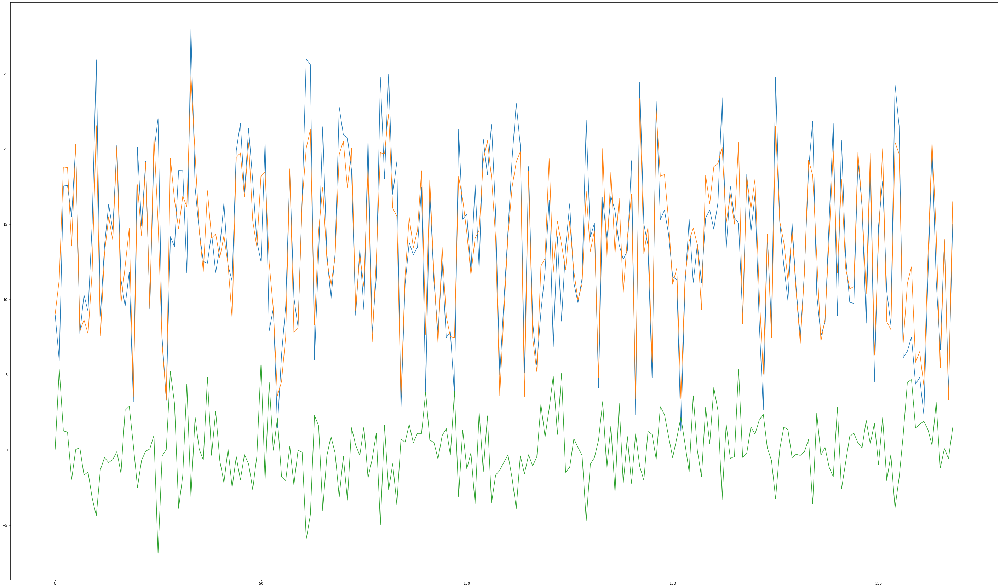

In [245]:
plt.figure(figsize = (50,30))
plt.plot(y_test)
plt.plot(y_pred)
plt.plot(y_pred-y_test)

In [246]:
import xgboost as xgb
from xgboost import plot_importance, plot_tree

In [247]:
reg=xgb.XGBRegressor(n_estimators=1000)
reg.fit(X_train, y_train,
       eval_set=[(X_train, y_train), (X_test, y_test)],
       early_stopping_rounds=300,
       verbose=True) 

[0]	validation_0-rmse:9.74482	validation_1-rmse:10.20053
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 300 rounds.
[1]	validation_0-rmse:6.98833	validation_1-rmse:7.44668
[2]	validation_0-rmse:5.05449	validation_1-rmse:5.46470
[3]	validation_0-rmse:3.68557	validation_1-rmse:4.08195
[4]	validation_0-rmse:2.72085	validation_1-rmse:3.15571
[5]	validation_0-rmse:2.05103	validation_1-rmse:2.52665
[6]	validation_0-rmse:1.59891	validation_1-rmse:2.09770
[7]	validation_0-rmse:1.29362	validation_1-rmse:1.78629
[8]	validation_0-rmse:1.08010	validation_1-rmse:1.59658
[9]	validation_0-rmse:0.93057	validation_1-rmse:1.47164
[10]	validation_0-rmse:0.82341	validation_1-rmse:1.34600
[11]	validation_0-rmse:0.75794	validation_1-rmse:1.27193
[12]	validation_0-rmse:0.70063	validation_1-rmse:1.24836
[13]	validation_0-rmse:0.67023	validation_1-rmse:1.20524
[14]	validation_0-rmse:0.63111	validation_1-rmse:1.

XGBRegressor(base_score=0.5, booster=None, colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints=None,
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints=None,
             n_estimators=1000, n_jobs=0, num_parallel_tree=1,
             objective='reg:squarederror', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, subsample=1, tree_method=None,
             validate_parameters=False, verbosity=None)

In [248]:
y_pred=reg.predict(X_test)

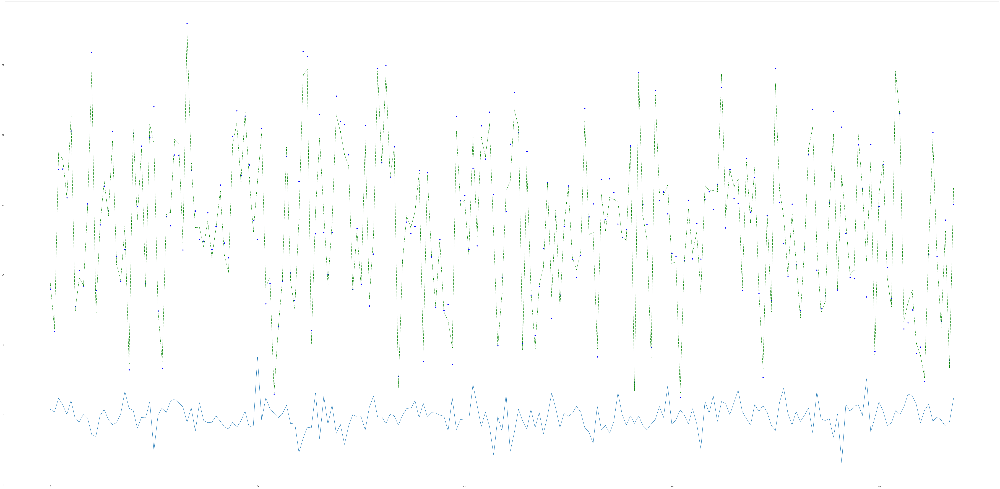

In [249]:
plt.figure(figsize = (100,50))
plt.plot(y_test, 'bo')
plt.plot(y_pred, color='green', marker='.', linestyle='dashed')
plt.plot(y_pred-y_test)

In [250]:
error=np.sqrt(metrics.mean_squared_error(y_test,y_pred))


In [251]:
print ('RMSE value of the SVR Model is:', error)

RMSE value of the SVR Model is: 0.9835313144157888


In [252]:
from statsmodels.tsa.seasonal import seasonal_decompose

In [253]:
series

NameError: name 'series' is not defined

Descision Tree

In [254]:
from sklearn.tree import DecisionTreeRegressor

In [255]:
minDepth= 100
minRMSE= 10000

In [256]:


for depth in range(2,40):
    tree_reg =DecisionTreeRegressor(max_depth=depth)
    tree_reg.fit(X_train, y_train)
    y_pred= tree_reg.predict(X_test)
    mse=metrics.mean_squared_error(y_test, y_pred)
    rmse=np.sqrt(mse)
    print("Depth:",depth,", MSE:", mse)
    print("Depth:",depth,", MSE:", rmse)
    
    if rmse < minRMSE:
        minRMSE = rmse
        minDepth = depth
    
      
print("MinDepth:", minDepth)
print("MinRMSE:", minRMSE)

Depth: 2 , MSE: 11.735426408734229
Depth: 2 , MSE: 3.425700863872126
Depth: 3 , MSE: 10.552642366894398
Depth: 3 , MSE: 3.2484830870568495
Depth: 4 , MSE: 8.679732836491649
Depth: 4 , MSE: 2.9461386315806064
Depth: 5 , MSE: 7.128723756000551
Depth: 5 , MSE: 2.6699669953017304
Depth: 6 , MSE: 6.419416594846836
Depth: 6 , MSE: 2.533656763424524
Depth: 7 , MSE: 5.810885710739968
Depth: 7 , MSE: 2.4105778790032835
Depth: 8 , MSE: 5.557663645788613
Depth: 8 , MSE: 2.3574697550103614
Depth: 9 , MSE: 4.721410699825185
Depth: 9 , MSE: 2.1728807375981742
Depth: 10 , MSE: 4.120947833955706
Depth: 10 , MSE: 2.0300117817283
Depth: 11 , MSE: 3.838847671433725
Depth: 11 , MSE: 1.959297749560726
Depth: 12 , MSE: 3.5236434432410686
Depth: 12 , MSE: 1.87713703368749
Depth: 13 , MSE: 3.2850543624938853
Depth: 13 , MSE: 1.8124718928838277
Depth: 14 , MSE: 3.487205771310589
Depth: 14 , MSE: 1.8674061613132236
Depth: 15 , MSE: 3.376304018323195
Depth: 15 , MSE: 1.8374721816460773
Depth: 16 , MSE: 3.4613925

In [257]:
DTree=DecisionTreeRegressor(max_depth=21)
DTree.fit(X_train, y_train)
print(DTree.score(X_train,y_train))

0.9999999276600335


In [258]:
print('MAE:', metrics.mean_absolute_error(y_test, DTree.predict(X_test)))
print('MSE:', metrics.mean_squared_error(y_test, DTree.predict(X_test)))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, DTree.predict(X_test))))

MAE: 1.1007077625570776
MSE: 3.2819731735159805
RMSE: 1.8116216971310486


In [259]:
y_pred=DTree.predict(X_test)

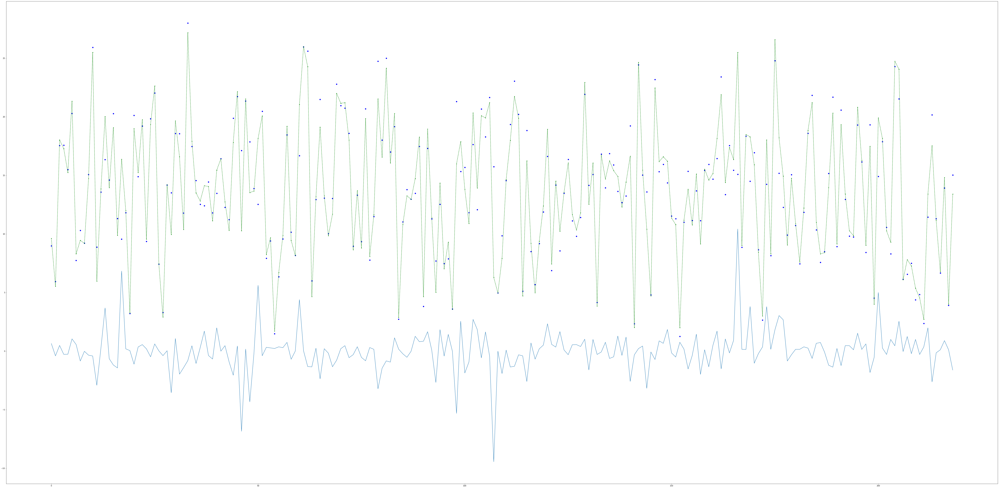

In [260]:
plt.figure(figsize = (100,50))
plt.plot(y_test, 'bo')
plt.plot(y_pred, color='green', marker='.', linestyle='dashed')
plt.plot(y_pred-y_test)

Ensemble learning

In [261]:
from sklearn.ensemble import VotingRegressor

In [262]:
ereg = VotingRegressor(estimators=[('Dt',DTree),('RD',regressor),('SVR',Svr)])
ereg.fit(X_train, y_train)

VotingRegressor(estimators=[('Dt',
                             DecisionTreeRegressor(ccp_alpha=0.0,
                                                   criterion='mse',
                                                   max_depth=21,
                                                   max_features=None,
                                                   max_leaf_nodes=None,
                                                   min_impurity_decrease=0.0,
                                                   min_impurity_split=None,
                                                   min_samples_leaf=1,
                                                   min_samples_split=2,
                                                   min_weight_fraction_leaf=0.0,
                                                   presort='deprecated',
                                                   random_state=None,
                                                   splitter='best')),
                            ('RD'

In [263]:
y_pred=ereg.predict(X_test)

In [264]:
from sklearn import metrics
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test,y_pred))
print('Mean Squared Error', metrics.mean_squared_error(y_test, y_pred))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
print('Accuracy_score:', metrics.r2_score(y_test,y_pred))

Mean Absolute Error: 1.0410466647202208
Mean Squared Error 1.9598461325997
Root Mean Squared Error: 1.399945046278496
Accuracy_score: 0.9381622691082222


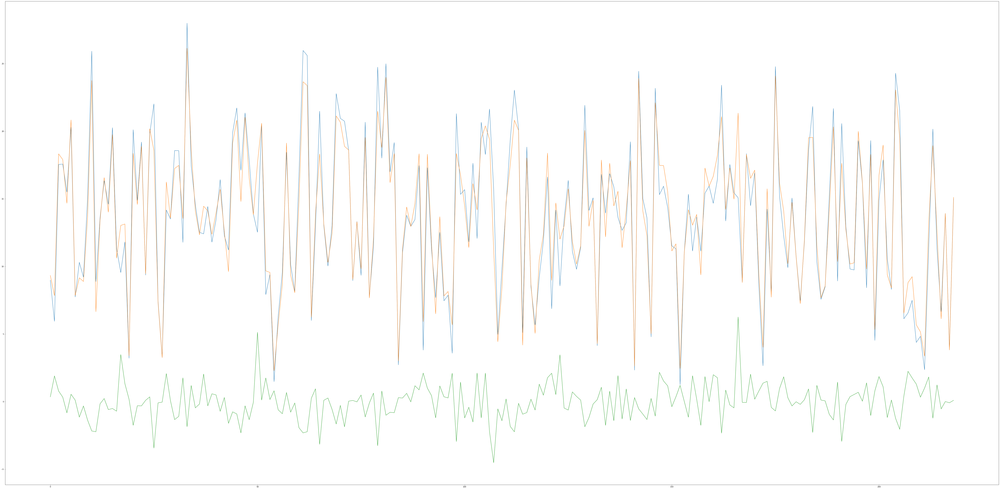

In [265]:
plt.figure(figsize = (100,50))
plt.plot(y_test, 
)
plt.plot(y_pred, 
        )
plt.plot(y_pred-y_test)

In [266]:
h=y_pred-y_test

In [267]:
from scipy.stats import norm

In [268]:
mu, std = norm.fit(h)

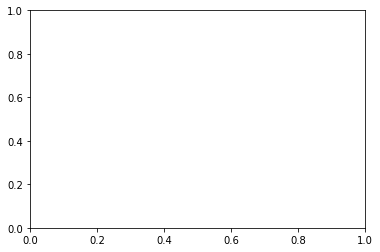

In [269]:
xmin, xmax = plt.xlim()

In [270]:
x = np.linspace(xmin, xmax, 100)
p = norm.pdf(x, mu, std)

(array([ 1.,  5., 29., 52., 80., 37., 11.,  2.,  1.,  1.]),
 array([-4.51805795, -3.44033362, -2.36260928, -1.28488495, -0.20716061,
         0.87056372,  1.94828806,  3.02601239,  4.10373673,  5.18146106,
         6.2591854 ]),
 <a list of 10 Patch objects>)

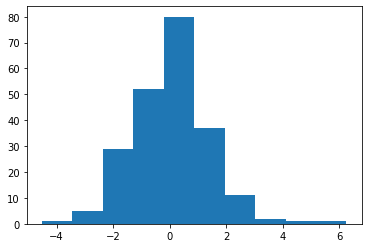

In [271]:
plt.hist(h, linewidth=2)

In [272]:
 from scipy import stats

In [273]:
k2, p = stats.normaltest(h)
alpha = 1e-3

In [277]:
alpha

0.001

In [274]:
print(p)

9.507339270990481e-05


In [278]:
p

9.507339270990481e-05

In [279]:
print(k2)

18.521722819579026


In [283]:
p < alpha

True

In [280]:
if p < alpha:  # null hypothesis: x comes from a normal distribution
    print("The null hypothesis can be rejected")
else:
    print("The null hypothesis cannot be rejected")

The null hypothesis can be rejected


In [281]:
df.head()

,Year,Month,Day,Hour,Minute,Temperature,RelativeHumidity,MeanSeaLevelPressure,TotalPrecipationhigh,TotalPrecipationlow,...,LowCloudCover,SunshineDuration,ShortwaveRadiation,WindSpeed10,WindDirection10,WindSpeed80,WindDirection80,WindSpeed900,WindDirection900,WindGust
0,1985,2,16,0,0,-4.30,84.0,1026.4,NaN,0.0,...,100.0,-999.0,0.0,13.79,69.36,10.58,70.96,52.29,87.61,26.64
1,1985,2,16,1,0,-4.51,84.0,1027.1,NaN,0.0,...,14.0,0.0,0.0,12.37,69.21,10.82,72.83,59.68,88.68,26.28
2,1985,2,16,2,0,-4.85,85.0,1027.6,NaN,0.0,...,9.0,0.0,0.0,11.04,67.87,10.35,74.99,64.85,89.73,26.28
3,1985,2,16,3,0,-6.34,88.0,1027.8,NaN,0.0,...,6.0,0.0,0.0,9.93,68.20,9.23,76.43,67.10,91.35,29.88
4,1985,2,16,4,0,-8.75,85.0,1028.5,NaN,0.0,...,3.0,0.0,0.0,9.62,67.46,7.51,75.27,67.18,93.18,29.52


In [4]:
df_l=df.drop(df[(df['Month'] ==12) | (df['Month'] ==1) | (df['Month'] ==2) | (df['Month'] ==8) | (df['Month'] ==7)| (df['Month'] ==6) | (df['Month'] ==5) | (df['Month'] ==4) | (df['Month'] ==3) | (df['Month'] ==3) ].index)

In [5]:
X=df_l.iloc[:,[0,5]].values

In [7]:
X.shape

(76440, 2)

In [16]:
result_array=X[:2184,:]
for i in range(2184,76440,2184):
    result=X[i:2184+i,:]
    result_array = np.concatenate((result_array, result), axis=1)

In [17]:
result_array

array([[1985.  ,   20.12, 1986.  , ...,   13.37, 2019.  ,   22.34],
       [1985.  ,   19.71, 1986.  , ...,   13.25, 2019.  ,   21.04],
       [1985.  ,   18.95, 1986.  , ...,   13.18, 2019.  ,   19.43],
       ...,
       [1985.  ,    5.52, 1986.  , ...,    8.22, 2019.  ,    3.56],
       [1985.  ,    5.68, 1986.  , ...,    8.  , 2019.  ,    3.28],
       [1985.  ,    5.78, 1986.  , ...,    6.76, 2019.  ,    3.23]])

In [10]:
result_array.shape

(2184, 210)

In [11]:
train=np.delete(result_array,209, 1)

In [12]:
train.shape

(2184, 209)

In [13]:
train

array([[1.985e+03, 9.000e+00, 1.000e+00, ..., 1.000e+00, 0.000e+00,
        0.000e+00],
       [1.985e+03, 9.000e+00, 1.000e+00, ..., 1.000e+00, 1.000e+00,
        0.000e+00],
       [1.985e+03, 9.000e+00, 1.000e+00, ..., 1.000e+00, 2.000e+00,
        0.000e+00],
       ...,
       [1.985e+03, 1.100e+01, 3.000e+01, ..., 3.000e+01, 2.100e+01,
        0.000e+00],
       [1.985e+03, 1.100e+01, 3.000e+01, ..., 3.000e+01, 2.200e+01,
        0.000e+00],
       [1.985e+03, 1.100e+01, 3.000e+01, ..., 3.000e+01, 2.300e+01,
        0.000e+00]])

In [229]:
y=result_array[:2184,209]

In [230]:
y

array([22.34, 21.04, 19.43, ...,  3.56,  3.28,  3.23])

In [317]:
y=X[10920:13104,69]

In [318]:
y

array([11.3 , 10.54,  9.85, ...,  0.28, -1.16, -2.23])

In [313]:
10920+2184

13104